# **StarGAN v2**

A Pytorch implementation of StarGAN v2  
  
**Dataset:** CelebA

**Reference:**  

In [1]:
import torch
import torch.nn as nn
import torchvision
import torchvision.utils as utils
import torch.optim as optim
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torch.nn.functional as F
from torch.utils.data import DataLoader

import cv2
import matplotlib.pyplot as plt
import numpy as np
from glob import glob
import pickle
import csv
import math
import random

## Hyperparameters

In [2]:
nf = 64
nz = 64
nd = 2
sdim = 64

lambda_gp = 1.
lambda_sty = 1.
lambda_ds = 1.
lambda_cyc = 1.

lr = 1e-4
lr_f = 1e-6
betas = (0.0, 0.99)
weight_decay = 1e-4

batch_size = 8
epochs = 5
ds_epochs = 5
n_print = 100
n_img_save = 2000

workers = 2
isCuda = True
device = torch.device("cuda:0" if (torch.cuda.is_available() and isCuda) else "cpu")
torch.backends.cudnn.benchmark = True
print("Device: {}".format(device))

model_saved_dir = "."

Device: cuda:0


## Dataset

In [3]:
class CelebA(torch.utils.data.Dataset):
    def __init__(self, split):
        s, e = {'train': (1,182637), 'valid': (182638, 202399),
                'test': (202400, 202499), 'test_ref': (202500, 202599)}[split]
        
        self.dir = '../input/celeba-dataset/img_align_celeba/img_align_celeba/'
        self.all_files = ['{0:06d}.jpg'.format(i) for i in range(s, e+1)]
        self.files = ['{0:06d}.jpg'.format(i) for i in range(s, e+1)]
        self.length = e + 1 - s

        self.labels = {}
        with open('../input/celeba-dataset/list_attr_celeba.csv','r') as f:
            rdr = csv.reader(f)
            for line in rdr:
                if line[21] == 'Male': continue
                self.labels[line[0]] = (int(line[21]) + 1) // 2
        
        img_size = 128
        if split == 'train':
            crop = transforms.RandomResizedCrop(img_size, scale=[0.8, 1.0], ratio=[0.9, 1.1])
            self.transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Lambda(lambda x: crop(x) if random.random() < 0.5 else x),
                transforms.Resize([img_size, img_size]),
                transforms.RandomHorizontalFlip(),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
            ])
        else:
            self.transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Resize([img_size, img_size]),
                transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
            ])

    def __getitem__(self, index):
        filename = self.files[index]
        img = cv2.imread(self.dir + filename)
        label = self.labels[filename]

        if self.transform:
            img = self.transform(img)
            
        return img, torch.LongTensor([label])
    
    def sample(self, n):
        if n > len(self.all_files): n = len(self.all_files)
        self.files = random.sample(self.all_files, n)
        self.length = n

    def __len__(self):
        return self.length


# Restore images to suitable images of opencv style
def ImgForPlot(img):
    img = np.einsum('ijk->jki', img)
    img = (127.5*(img+1)).astype(np.uint8)
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

In [4]:
dataset = CelebA('train')
ref_dataset = CelebA('train')
ref2_dataset = CelebA('train')

test_dataset = CelebA('test')
test_ref_dataset = CelebA('test_ref')

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)
ref_dataloader = DataLoader(ref_dataset, batch_size=batch_size, shuffle=True, num_workers=workers)
ref2_dataloader = DataLoader(ref2_dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=workers)
ref_test_dataloader = DataLoader(test_ref_dataset, batch_size=16, shuffle=False, num_workers=workers)

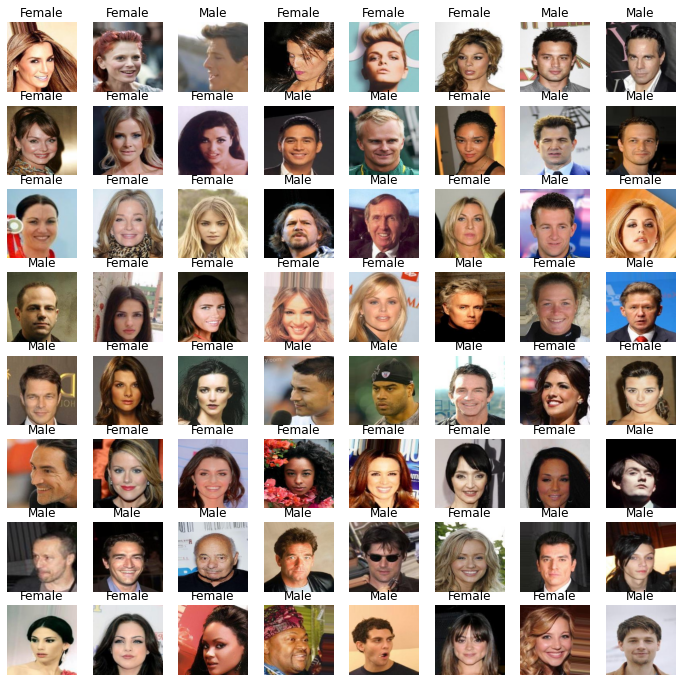

In [5]:
fig = plt.figure(figsize=(12,12))

classes = ['Female', 'Male']
for k in range(64):
    img, label = dataset[k]
    ax = fig.add_subplot(8, 8, k+1)
    ax.imshow(ImgForPlot(img))
    ax.axis("off")
    ax.set_title(classes[label])

plt.show()

## Model

In [6]:
def init_conv_weight(m):
    if isinstance(m, nn.Conv2d):
        nn.init.kaiming_uniform_(m.weight)
        if m.bias is not None:
            nn.init.constant_(m.bias, 0.)

def init_fc_weight_zero(m):
    if isinstance(m, nn.Linear):
        nn.init.kaiming_uniform_(m.weight)
        nn.init.constant_(m.bias, 0.)

def init_fc_weight_one(m):
    if isinstance(m, nn.Linear):
        nn.init.kaiming_uniform_(m.weight)
        nn.init.constant_(m.bias, 1.)

### ResBlock

In [7]:
class ResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, norm=False, down=False):
        super(ResBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_ch, in_ch, 3, 1, 1)
        self.conv2 = nn.Conv2d(in_ch, out_ch, 3, 1, 1)

        self.norm = norm
        if norm:
            self.norm1 = nn.InstanceNorm2d(in_ch, affine=True)
            self.norm2 = nn.InstanceNorm2d(in_ch, affine=True)

        self.lrelu = nn.LeakyReLU(0.2)
        self.is_down = down

        self.is_sc = in_ch != out_ch
        if self.is_sc:
            self.sc = nn.Conv2d(in_ch, out_ch, 1, 1, 0, bias=False)

    def down(self, x):
        return F.avg_pool2d(x, 2)

    def forward(self, x):
        if self.norm: res = self.norm1(x)
        else: res = x
        res = self.conv1(self.lrelu(res))
        if self.is_sc: x = self.sc(x)
        if self.is_down:
            x = self.down(x)
            res = self.down(res)
        if self.norm: res = self.norm2(res)
        res = self.conv2(self.lrelu(res))
        return (x + res) / math.sqrt(2)

### AdaINResBlock

In [8]:
class AdaIN(nn.Module):
    def __init__(self, sdim, nf):
        super(AdaIN, self).__init__()
        self.norm = nn.InstanceNorm2d(nf)
        self.gamma = nn.Linear(sdim, nf)
        self.beta = nn.Linear(sdim, nf)
        self.apply(init_fc_weight_one)

    def forward(self, x, s):
        B, C, H, W = x.size()
        return (1 + self.gamma(s).view(B, C, 1, 1)) * self.norm(x) + self.beta(s).view(B, C, 1, 1)

In [9]:
class AdaINResBlock(nn.Module):
    def __init__(self, in_ch, out_ch, sdim, up=False):
        super(AdaINResBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_ch, out_ch, 3, 1, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, 1, 1)
        self.norm1 = AdaIN(sdim, in_ch)
        self.norm2 = AdaIN(sdim, out_ch)
        self.lrelu = nn.LeakyReLU(0.2)
        self.is_up = up
        self.is_sc = in_ch != out_ch
        if self.is_sc:
            self.sc = nn.Conv2d(in_ch, out_ch, 1, 1, 0, bias=False)

    def up(self, x):
        return F.interpolate(x, scale_factor=2, mode='nearest')

    def forward(self, x, s):
        res = self.lrelu(self.norm1(x, s))
        if self.is_up:
            x = self.up(x)
            res = self.up(res)
        if self.is_sc: x = self.sc(x)
        res = self.conv1(res)
        res = self.conv2(self.lrelu(self.norm2(res, s)))
        return (x + res) / math.sqrt(2)

### Generator

In [10]:
class Generator(nn.Module):
    def __init__(self, nf, sdim):
        super(Generator, self).__init__()
        self.conv_in = nn.Conv2d(3, nf, 3, 1, 1)
        self.enc = nn.Sequential(
            ResBlock(nf, 2*nf, norm=True, down=True),
            ResBlock(2*nf, 4*nf, norm=True, down=True),
            ResBlock(4*nf, 8*nf, norm=True, down=True),
            ResBlock(8*nf, 8*nf, norm=True),
            ResBlock(8*nf, 8*nf, norm=True)
        )
        self.dec = nn.ModuleList([
            AdaINResBlock(8*nf, 8*nf, sdim),
            AdaINResBlock(8*nf, 8*nf, sdim),
            AdaINResBlock(8*nf, 4*nf, sdim, up=True),
            AdaINResBlock(4*nf, 2*nf, sdim, up=True),
            AdaINResBlock(2*nf, nf, sdim, up=True)
        ])
        self.conv_out = nn.Sequential(
            nn.InstanceNorm2d(nf, affine=True),
            nn.LeakyReLU(0.2),
            nn.Conv2d(nf, 3, 1, 1, 0)
        )
        self.apply(init_conv_weight)

    def forward(self, x, s):
        x = self.conv_in(x)
        x = self.enc(x)
        for layer in self.dec:
            x = layer(x, s)
        x = self.conv_out(x)
        return x

### Mapping Network

In [11]:
class MappingNetwork(nn.Module):
    def __init__(self, nz, nd, sdim):
        super(MappingNetwork, self).__init__()
        self.shared = nn.Sequential(
            nn.Linear(nz, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
        )

        self.unshared = nn.ModuleList()
        for i in range(nd):
            self.unshared.append(nn.Sequential(
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, 512),
                nn.ReLU(),
                nn.Linear(512, sdim)
            ))

        self.apply(init_conv_weight)
        self.apply(init_fc_weight_zero)

    def forward(self, z, y):          # z: B x nz, y: B
        B = z.size(0)
        z = self.shared(z)            # B x 512
        s = [layer(z) for layer in self.unshared]
        s = torch.stack(s, dim=1)     # B x nd x sdim
        i = torch.LongTensor(range(B)).cuda()
        return s[i, y]                # B x sdim

### Discriminator

In [12]:
class Discriminator(nn.Module):
    def __init__(self, nf, nd):
        super(Discriminator, self).__init__()
        self.conv_in = nn.Conv2d(3, nf, 3, 1, 1)
        self.res = nn.Sequential(
            ResBlock(nf, 2*nf, down=True),
            ResBlock(2*nf, 4*nf, down=True),
            ResBlock(4*nf, 8*nf, down=True),
            ResBlock(8*nf, 8*nf, down=True),
            ResBlock(8*nf, 8*nf, down=True)
        )
        self.conv_out = nn.Sequential(
            nn.LeakyReLU(0.2),
            nn.Conv2d(8*nf, 8*nf, 4, 1, 0),
            nn.LeakyReLU(0.2),
            nn.Conv2d(8*nf, nd, 1, 1, 0)
        )
        self.apply(init_conv_weight)

    def forward(self, x, y):        # x: B x 3 x 128 x 128, y: B
        B = x.size(0)
        x = self.conv_in(x)         # B x nf x 128 x 128
        x = self.res(x)             # B x 8nf x 4 x 4
        x = self.conv_out(x)        # B x nd x 1 x 1
        x = x.view(B, -1)           # B x nd
        i = torch.LongTensor(range(B)).cuda()
        return x[i, y]              # B

### Style Encoder

In [13]:
class StyleEncoder(nn.Module):
    def __init__(self, nf, nd, sdim):
        super(StyleEncoder, self).__init__()
        self.conv_in = nn.Conv2d(3, nf, 3, 1, 1)
        self.res = nn.Sequential(
            ResBlock(nf, 2*nf, down=True),
            ResBlock(2*nf, 4*nf, down=True),
            ResBlock(4*nf, 8*nf, down=True),
            ResBlock(8*nf, 8*nf, down=True),
            ResBlock(8*nf, 8*nf, down=True)
        )
        self.conv_out = nn.Sequential(
            nn.LeakyReLU(0.2),
            nn.Conv2d(8*nf, 8*nf, 4, 1, 0),
            nn.LeakyReLU(0.2),
            nn.Conv2d(8*nf, nd*sdim, 1, 1, 0)
        )
        self.nd = nd
        self.apply(init_conv_weight)

    def forward(self, x, y):            # x: B x 3 x 128 x 128, y: B
        B = x.size(0)
        x = self.conv_in(x)             # B x nf x 128 x 128
        x = self.res(x)                 # B x 8nf x 4 x 4
        x = self.conv_out(x)            # B x nd*sdim x 1 x 1
        x = x.view(B, self.nd, -1)      # B x nd x sdim
        i = torch.LongTensor(range(B)).cuda()
        return x[i, y]                  # B x sdim

In [14]:
class Model:
    def __init__(self, nf, nz, nd, sdim, lr, lr_f, betas, weight_decay):
        self.G = Generator(nf, sdim).cuda()
        self.F = MappingNetwork(nz, nd, sdim).cuda()
        self.D = Discriminator(nf, nd).cuda()
        self.E = StyleEncoder(nf, nd, sdim).cuda()

        self.optG = optim.Adam(self.G.parameters(), lr=lr, betas=betas, weight_decay=weight_decay)
        self.optF = optim.Adam(self.F.parameters(), lr=lr_f, betas=betas, weight_decay=weight_decay)
        self.optD = optim.Adam(self.D.parameters(), lr=lr, betas=betas, weight_decay=weight_decay)
        self.optE = optim.Adam(self.E.parameters(), lr=lr, betas=betas, weight_decay=weight_decay)

    def save(self, path):
        torch.save(self.G.state_dict(), path + '_G.pt')
        torch.save(self.F.state_dict(), path + '_F.pt')
        torch.save(self.D.state_dict(), path + '_D.pt')
        torch.save(self.E.state_dict(), path + '_E.pt')

    def load(self, path):
        self.G.load_state_dict(torch.load(path + '_G.pt'))
        self.F.load_state_dict(torch.load(path + '_F.pt'))
        self.D.load_state_dict(torch.load(path + '_D.pt'))
        self.E.load_state_dict(torch.load(path + '_E.pt'))

    def zero_grad(self):
        self.optG.zero_grad()
        self.optF.zero_grad()
        self.optD.zero_grad()
        self.optE.zero_grad()

    def train(self):
        self.G.train()
        self.F.train()
        self.D.train()
        self.E.train()

    def eval(self):
        self.G.eval()
        self.F.eval()
        self.D.eval()
        self.E.eval()

## Training

In [15]:
model = Model(nf, nz, nd, sdim, lr, lr_f, betas, weight_decay)

### (Option) Load Model

In [16]:
model_name = 'stargan-v2-celeba'
output_dir = '../input/stargan-v2'

loss_path = F"{output_dir}/{model_name}_loss.txt"
img_path = F"{output_dir}/{model_name}_img.pkl"
model_path = F"{output_dir}/{model_name}"

with open(loss_path, 'rb') as f:
    losses = pickle.load(f)

with open(img_path, 'rb') as f:
    imgs = pickle.load(f)
    
model.load(model_path)

### Gradient Penalty

In [17]:
def gradient_penalty(out, x):
    grad = torch.autograd.grad(
        outputs=out.sum(),
        inputs=x,
        create_graph=True,
        retain_graph=True,
        only_inputs=True
    )[0].view(x.size(0), -1)
    return 0.5 * torch.mean(torch.sum(grad.pow(2), dim=1))

### Training Model

In [18]:
import time

model_name = 'stargan-v2-celeba'

loss_path = F"{model_saved_dir}/{model_name}_loss.txt"
img_path = F"{model_saved_dir}/{model_name}_img.pkl"
model_path = F"{model_saved_dir}/{model_name}"

start_epoch = 4

if start_epoch == 0:
    losses = {'train_d1': [], 'train_d2': [], 'train_g1': [], 'train_g2': []}
    imgs = []


l1 = nn.L1Loss()

lambda_ds_zero = lambda_ds
lambda_ds = max((lambda_ds_zero * (ds_epochs - start_epoch)) / epochs, 0.)

step, d1_sum, d2_sum, g1_sum, g2_sum = 0, 0., 0., 0., 0.
for ep in range(start_epoch, epochs):
    model.train()
    timestamp = time.time()
    for batch_idx, ((x, y), (x_ref, y_), (x_ref2, _)) in enumerate(zip(dataloader, ref_dataloader, ref2_dataloader)):
        step += 1
        x = x.cuda()
        x.requires_grad_()
        y = y.cuda().squeeze(1)
        x_ref = x_ref.cuda()
        y_ = y_.cuda().squeeze(1)
        x_ref2 = x_ref2.cuda()
        z = torch.randn((x.size(0), nz)).cuda()

        # Train Discriminator with z
        model.zero_grad()
        out = model.D(x, y)
        real_label = torch.full_like(out, fill_value=1)
        loss_real = F.binary_cross_entropy_with_logits(out, real_label)
        loss_gp = gradient_penalty(out, x)

        with torch.no_grad():
            s_ = model.F(z, y_)
            x_ = model.G(x, s_)
        out = model.D(x_, y_)

        fake_label = torch.full_like(out, fill_value=0)
        loss_fake = F.binary_cross_entropy_with_logits(out, fake_label)

        loss = loss_real + loss_fake + lambda_gp * loss_gp    
        loss.backward()
        model.optD.step()

        losses['train_d1'].append(loss.item())
        d1_sum += loss.item()

        # Train Discriminator with x_ref
        model.zero_grad()
        out = model.D(x, y)
        real_label = torch.full_like(out, fill_value=1)
        loss_real = F.binary_cross_entropy_with_logits(out, real_label)
        loss_gp = gradient_penalty(out, x)

        with torch.no_grad():
            s_ = model.E(x_ref, y_)
            x_ = model.G(x, s_)

        out = model.D(x_, y_)
        fake_label = torch.full_like(out, fill_value=0)
        loss_fake = F.binary_cross_entropy_with_logits(out, fake_label)

        loss = loss_real + loss_fake + lambda_gp * loss_gp    
        loss.backward()
        model.optD.step()

        losses['train_d2'].append(loss.item())
        d2_sum += loss.item()

        # Train Generator with z, z2
        model.zero_grad()

        s_ = model.F(z, y_)
        x_ = model.G(x, s_)
        out = model.D(x_, y_)
        real_label = torch.full_like(out, fill_value=1)
        loss_adv = F.binary_cross_entropy_with_logits(out, real_label)

        s_pred = model.E(x_, y_)
        loss_sty = l1(s_, s_pred)

        z2 = torch.randn((x.size(0), nz)).cuda()
        s_2 = model.F(z2, y_)
        x_2 = model.G(x, s_2)
        loss_ds = l1(x_, x_2.detach())

        s = model.E(x, y)
        x_rec = model.G(x_, s)
        loss_cyc = l1(x, x_rec)

        loss = loss_adv + lambda_sty * loss_sty - lambda_ds * loss_ds + lambda_cyc * loss_cyc
        loss.backward()
        model.optG.step()
        model.optF.step()
        model.optE.step()

        losses['train_g1'].append(loss.item())
        g1_sum += loss.item()

        # Train Generator with x_ref, x_ref2
        model.zero_grad()

        s_ = model.E(x_ref, y_)
        x_ = model.G(x, s_)
        out = model.D(x_, y_)
        real_label = torch.full_like(out, fill_value=1)
        loss_adv = F.binary_cross_entropy_with_logits(out, real_label)

        s_pred = model.E(x_, y_)
        loss_sty = l1(s_, s_pred)

        s_2 = model.E(x_ref2, y_)
        x_2 = model.G(x, s_2)
        loss_ds = l1(x_, x_2.detach())

        s = model.E(x, y)
        x_rec = model.G(x_, s)
        loss_cyc = l1(x, x_rec)

        loss = loss_adv + lambda_sty * loss_sty - lambda_ds * loss_ds + lambda_cyc * loss_cyc
        loss.backward()
        model.optG.step()
        losses['train_g2'].append(loss.item())
        g2_sum += loss.item()

        lambda_ds -= lambda_ds_zero / (len(dataloader) * epochs)
        lambda_ds = max(lambda_ds, 0.)
        
        if (batch_idx + ep * len(dataloader) + 1) % n_img_save == 0:
            model.eval()
            with torch.no_grad():
                temp_img = []
                for (x, _), (x_ref, y_) in zip(test_dataloader, ref_test_dataloader):
                    x = x.cuda()
                    x_ref = x_ref.cuda()
                    y_ = y_.cuda().squeeze(1)
                    s_ = model.E(x_ref, y_)
                    x_ = model.G(x, s_)
                    temp_img.append(x_)
                imgs.append(torch.cat(temp_img, dim=0))
            model.train()
            print("Iter %d: Generate images for test dataset" % (batch_idx + ep * len(dataloader) + 1))

        if (batch_idx + 1) % n_print == 0 or (batch_idx + 1) == len(dataloader):
            print('[%d/%d][%5d/%5d] Train (%ds)' % (ep+1, epochs, batch_idx+1, len(dataloader), time.time() - timestamp))
            print('\t[Loss] D1: %.4f / D2: %.4f / G1: %.4f / G2: %.4f' % (d1_sum/step, d2_sum/step, g1_sum/step, g2_sum/step))
            step, d1_sum, d2_sum, g1_sum, g2_sum = 0, 0., 0., 0., 0.
            timestamp = time.time()
    
    model.save(model_path)
    with open(loss_path, 'wb') as f:
        pickle.dump(losses, f)
    
    with open(img_path, 'wb') as f:
        pickle.dump(imgs, f)
        
    print("Saved model completely!")

[5/5][  100/22830] Train (108s)
	[Loss] D1: 1.4455 / D2: 1.1438 / G1: 1.3786 / G2: 1.1113
[5/5][  200/22830] Train (98s)
	[Loss] D1: 1.4440 / D2: 1.1347 / G1: 1.3855 / G2: 1.1270
[5/5][  300/22830] Train (98s)
	[Loss] D1: 1.4533 / D2: 1.1417 / G1: 1.3562 / G2: 1.1026
[5/5][  400/22830] Train (98s)
	[Loss] D1: 1.4461 / D2: 1.1347 / G1: 1.3929 / G2: 1.1250
[5/5][  500/22830] Train (98s)
	[Loss] D1: 1.4466 / D2: 1.1342 / G1: 1.3648 / G2: 1.1057
[5/5][  600/22830] Train (98s)
	[Loss] D1: 1.4493 / D2: 1.1341 / G1: 1.3706 / G2: 1.1124
Iter 92000: Generate images for test dataset
[5/5][  700/22830] Train (101s)
	[Loss] D1: 1.4529 / D2: 1.1527 / G1: 1.3118 / G2: 1.0901
[5/5][  800/22830] Train (98s)
	[Loss] D1: 1.4527 / D2: 1.1549 / G1: 1.3343 / G2: 1.0821
[5/5][  900/22830] Train (98s)
	[Loss] D1: 1.4422 / D2: 1.1624 / G1: 1.3595 / G2: 1.1202
[5/5][ 1000/22830] Train (98s)
	[Loss] D1: 1.4551 / D2: 1.1560 / G1: 1.3443 / G2: 1.0826
[5/5][ 1100/22830] Train (98s)
	[Loss] D1: 1.4456 / D2: 1.1696 

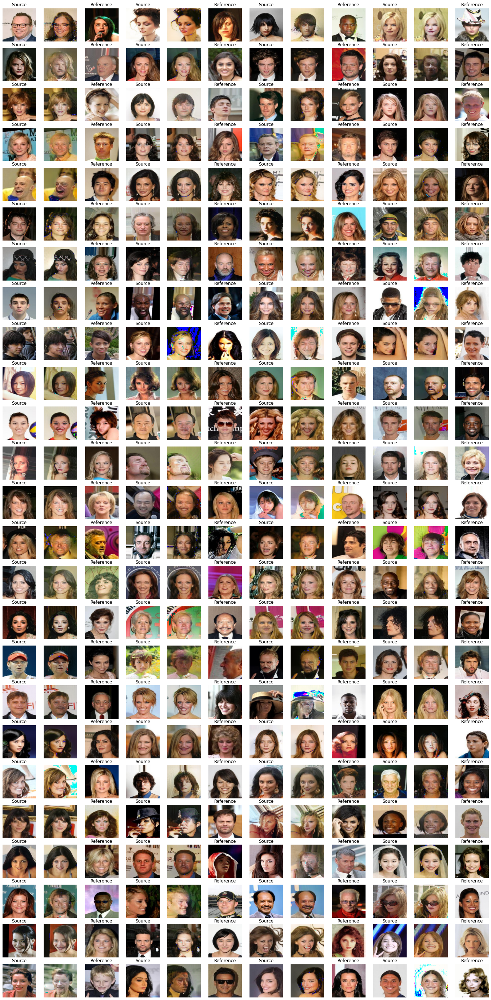

In [31]:
fig = plt.figure(figsize=(24,50))

img = imgs[-1]
classes = ['Female', 'Male']

for k in range(100):
    x, y = test_dataset[k]
    x_ref, y_ref = test_ref_dataset[k]
    ax = fig.add_subplot(25, 12, 3*k+1)
    ax.imshow(ImgForPlot(x))
    ax.axis("off")
    ax.set_title('Source')
    ax = fig.add_subplot(25, 12, 3*k+2)
    ax.imshow(ImgForPlot(img[k].cpu()))
    ax.axis("off")
    ax = fig.add_subplot(25, 12, 3*k+3)
    ax.imshow(ImgForPlot(x_ref))
    ax.axis("off")
    ax.set_title('Reference')

plt.savefig('test.png')

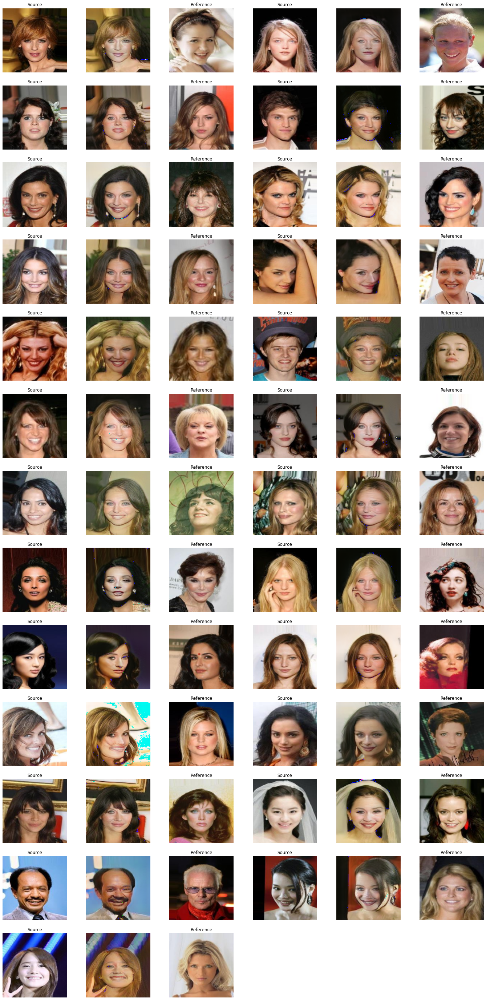

In [32]:
t = [8, 11, 13, 15, 17, 18, 30, 35, 42, 46, 48, 51, 56, 58, 60, 71, 72, 74, 76, 78, 80, 87, 90, 92, 95]

fig = plt.figure(figsize=(24,50))

img = imgs[-1]
classes = ['Female', 'Male']

for i, k in enumerate(t):
    x, y = test_dataset[k]
    x_ref, y_ref = test_ref_dataset[k]
    ax = fig.add_subplot(13, 6, 3*i+1)
    ax.imshow(ImgForPlot(x))
    ax.axis("off")
    ax.set_title('Source')
    ax = fig.add_subplot(13, 6, 3*i+2)
    ax.imshow(ImgForPlot(img[k].cpu()))
    ax.axis("off")
    ax = fig.add_subplot(13, 6, 3*i+3)
    ax.imshow(ImgForPlot(x_ref))
    ax.axis("off")
    ax.set_title('Reference')

plt.savefig('test-large.png')